

# End to end Multi class dog 🐶 breed classification

This notebook builds and end to end image calssifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem Definition
Identifying the breed of dog given an image of the dog

## 2. Data
The data we are using is from the kaggle dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evaluation
The Evaluation is a file with prediction probabilities for each dog breed of test image

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We have unstructured data.
* There are 120 dog breeds in the data we need to classify from one of them.
* We have about 10,000+ images in training set.
* We have about 10,000+ images in test set.

In [ ]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Get our workspace ready
* Import tensorflow ✔️
* Import tesorflow hub
* Make sure we are usig GPU

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

#check for GPU availability
print('GPU', 'Available' if tf.config.list_physical_devices('GPU') else 'Not available')

2.15.0
0.16.1
GPU Available


## Getting our data ready turnig it into tensors

As we are training machine learning models we need to have our data in numerical format so we will be turning our data into tensors (numerical representation)

In [ ]:
labels_csv = pd.read_csv('drive/MyDrive/Dog-vision/labels.csv')
labels_csv.describe()


,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


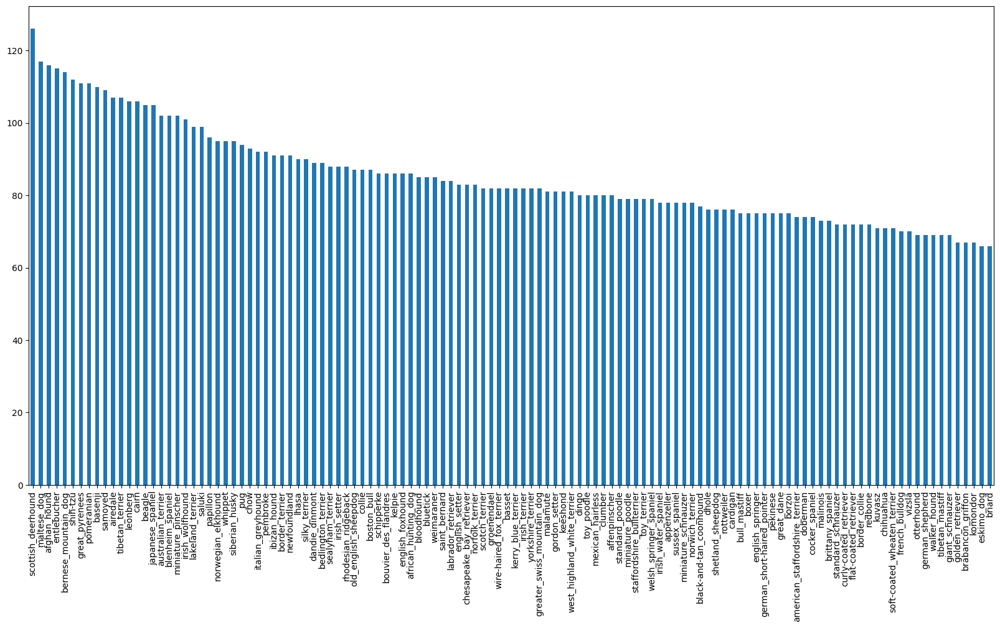

In [ ]:
labels_csv['breed'].value_counts().plot(figsize=(20,10), kind ='bar')
plt.show()

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

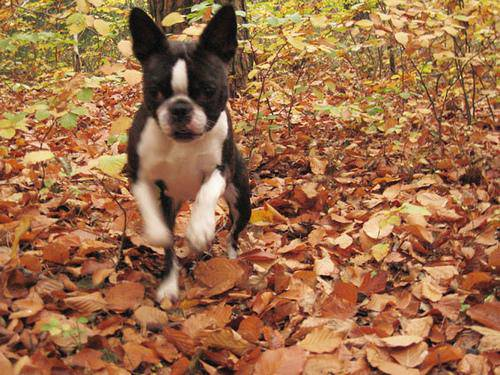

In [ ]:
# how to view image iside notebook
from IPython.display import Image
Image('drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images ready with their labels

Lets get list of all of our file pathnames.


In [ ]:
# create path name from image id's
filenames = ["drive/MyDrive/Dog-vision/train/"+fname +".jpg" for fname in labels_csv['id']]

#filenames[:10]
len(filenames)

10222

In [ ]:
import os
if(len(os.listdir('/content/drive/MyDrive/Dog-vision/train'))== len(filenames)):
  print("files verrified and matched to the amount")
else:
  print('Missing some files look through again')

len(os.listdir('/content/drive/MyDrive/Dog-vision/train'))

Missing some files look through again


10241

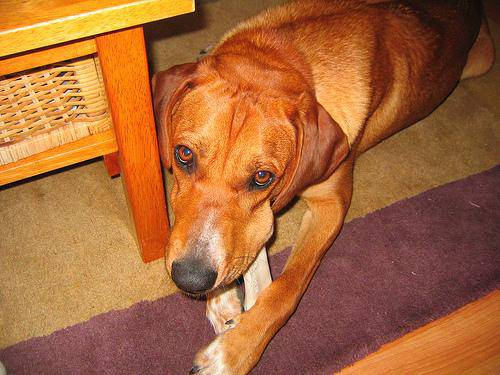

In [ ]:
Image(filenames[1021])

In [ ]:
labels_csv['breed'][1021]

'redbone'

### Now we have the images we will prepare the labels

we will convert the labels to a np array then to numbers as we need our data to be in numerical format


In [ ]:
# convert breed names to np array
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) does the same thing as above prefer whichever is easier to remember
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels)== len(filenames):
  print("All files exist")
else:
  print("Some files are missing")

All files exist


In [ ]:
# Find unique numbers of dog breed
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn Every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Truning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where true occurs in booleanlabels
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own train and validation split

As the data only come with train and test split we will also need to create a validation set which will help us better our model and look for improvements

In [ ]:
# Setup X and y

X = filenames
y = boolean_labels
# x is basically the image of the dog and y is just which breed the dog belongs to
# as we have created a true false array for it we call it label

We will start with 1000 images and then increase the images as we go on

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:500}

In [ ]:
# lets split data in train and test split
from sklearn.model_selection import train_test_split
# split data in training and validation of 1000 images

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=16)

len(X_train), len( X_val)

(800, 200)

### Processing images turning images into Tensors
To preprocess our image into Tensors we're going to write a function which does a few things.

1. Take a image filepath as input
2. Use tesorflow to read and store it to a variable `image`
3. Turn our `image` into Tensors
4. Resize the `image` to be shape of (224,224)
5. Return the modified `image`

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[16])
image.shape # 3 at the end is the color channel which means RGB all the images are combinatio of RGB pixels

(212, 374, 3)

In [ ]:
image.min(), image.max() # max value in image is 255 and min is 0 which lies exactly in our RGB spectrum

(0, 255)

In [ ]:
image # as we ca see the image is a n-d array of values for each pixels

array([[[  0,  62, 120],
        [  0,  62, 123],
        [  1,  65, 129],
        ...,
        [ 25,  55,  93],
        [ 22,  52,  88],
        [ 21,  51,  87]],

       [[  0,  61, 118],
        [  1,  63, 122],
        [  2,  63, 126],
        ...,
        [  4,  30,  63],
        [  0,  24,  57],
        [  1,  27,  60]],

       [[  2,  62, 116],
        [  3,  62, 118],
        [  3,  62, 122],
        ...,
        [  0,  12,  39],
        [  0,   5,  32],
        [  0,   9,  34]],

       ...,

       [[ 30,  55, 109],
        [ 30,  52, 102],
        [ 27,  44,  87],
        ...,
        [ 10,  10,  20],
        [  6,   6,  16],
        [  4,   4,  14]],

       [[ 22,  47, 101],
        [ 15,  37,  87],
        [  5,  22,  65],
        ...,
        [  6,   6,  16],
        [  2,   2,  12],
        [  0,   0,  10]],

       [[  3,  28,  82],
        [  0,  19,  69],
        [  0,   8,  51],
        ...,
        [  4,   4,  14],
        [  0,   0,  10],
        [  0,   0,   9]]

In [ ]:
# Converting the image to a tensor
tf.constant(image) # the nd array and tensor are the same thing except we can run  tensors on gpu which makes it faster

<tf.Tensor: shape=(212, 374, 3), dtype=uint8, numpy=
array([[[  0,  62, 120],
        [  0,  62, 123],
        [  1,  65, 129],
        ...,
        [ 25,  55,  93],
        [ 22,  52,  88],
        [ 21,  51,  87]],

       [[  0,  61, 118],
        [  1,  63, 122],
        [  2,  63, 126],
        ...,
        [  4,  30,  63],
        [  0,  24,  57],
        [  1,  27,  60]],

       [[  2,  62, 116],
        [  3,  62, 118],
        [  3,  62, 122],
        ...,
        [  0,  12,  39],
        [  0,   5,  32],
        [  0,   9,  34]],

       ...,

       [[ 30,  55, 109],
        [ 30,  52, 102],
        [ 27,  44,  87],
        ...,
        [ 10,  10,  20],
        [  6,   6,  16],
        [  4,   4,  14]],

       [[ 22,  47, 101],
        [ 15,  37,  87],
        [  5,  22,  65],
        ...,
        [  6,   6,  16],
        [  2,   2,  12],
        [  0,   0,  10]],

       [[  3,  28,  82],
        [  0,  19,  69],
        [  0,   8,  51],
        ...,
        [  4,   4,  1

In [ ]:
# making the function to pre process our images completely

def process_image (image_path, img_size=224):
  """
  Takes an image filepath and turns the image into tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jped image into tensor with 3 colour channels RGB
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalize the image turn it from 0-255 RGB colour codes to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

### Turning our data into batches
Why do we need to turn our data into bacthes?

Let's say you are trying to process 10,000+ images in one go, they might not fit in the memory

So thats why we do 32 images at a time

32 - batch size

We need our data in form of tensor tuples which looks like `image , labels`

In [ ]:
# Create a function that returns tuple of image, labels
def get_image_label(image_path, label):
  """
  Takes in image path name and the label corrosponding to it and then returns the image,label tuple
  """
  image = process_image(image_path)
  return image, label

### Creating data batches

Now we have our data in tensor tuples `(image, label)` we should convert them into batches

In [ ]:
# Create a function that turns data into batches
BATCH_SIZE = 32

def create_data_batch(X, y=None, batch_size=BATCH_SIZE, valid_data= False, test_data=False):
  """
  Creates batches of data out of image (X) and labels (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels)
  """
  # if data is test data set we dont have labels
  if test_data:
    print('Creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    #only file path no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if data is valid data we dont need to shuffle it
  elif valid_data:
    print('Creating a valid data batch')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepath
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepath
                                               tf.constant(y))) #labels

    # Shufflig the images before mapping it to the process_image fuction
    data = data.shuffle(buffer_size = len(X))
    # Create image,label tuples (also turns image path into processed image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# creating train batcehs
train_data = create_data_batch(X_train,y_train)

# creating valid data batches
val_data = create_data_batch(X_val, y_val, valid_data=True)

Creating training data batches
Creating a valid data batch


In [ ]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

Our data is in batches and it can be little hard to understand them so we will try and vizualize the data




In [ ]:
# Create a function that helps us view images in data batch
def show_images(images, labels):
  """
  Displays a plot of 25 images and their labels in data batch
  """
  # set up the figure
  plt.figure(figsize=(15,15))
  # loop through 25 images
  for i in range(25):
    ax= plt.subplot(5,5, i+1) # i+1 is the index for the images so it will go 1,2,3,4 ...
    #display a image
    plt.imshow(images[i])
    # display the labels
    plt.title(unique_breeds[labels[i].argmax()])#basically will print the string that corresponds to 1 in the labels array
    # trun the grid off
    plt.axis('off')


In [ ]:
train_data
# as we are working with batched images we will have to unbatch them to make the function understand the data
# we can do that by next(.as_numpy_iterators())

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

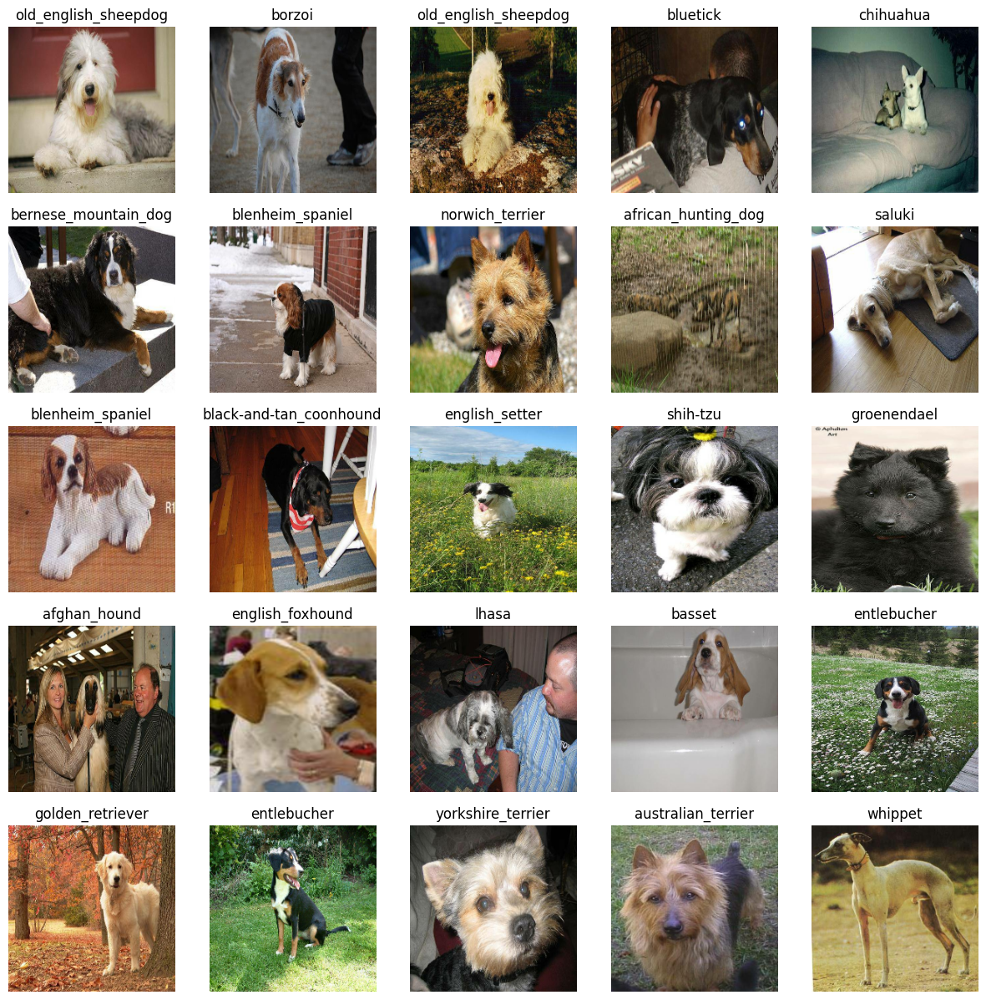

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels
# above is how you unbatch the data
show_images(train_images, train_labels)

# note when you run this cell everytime you will see different images becase the traindata is shuffled

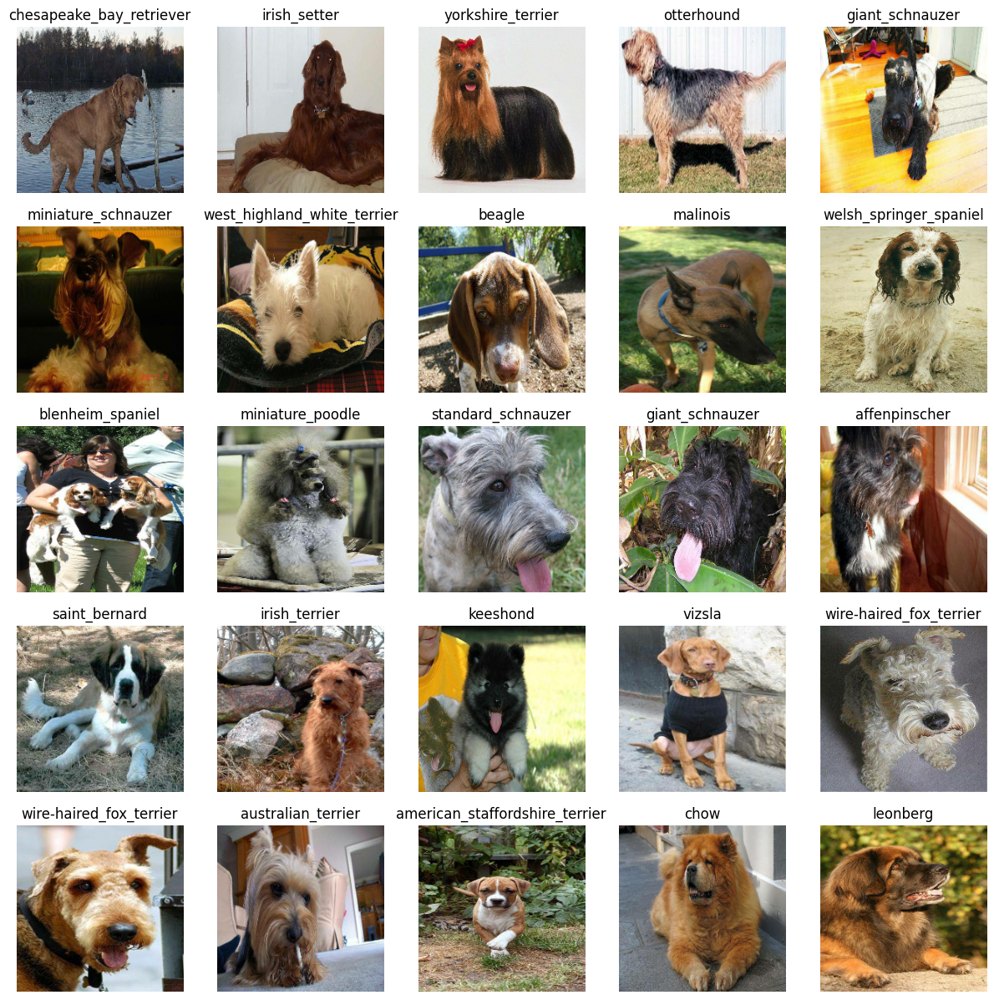

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images, val_labels
# above is how you unbatch the data
show_images(val_images, val_labels)
# Images are same alwasy cause data isnt shuffled

### Building a model

Before building a model there are few things we need to define:

*   The input shape of the image in form of tensors that we provide to our model.
*   The output shape (image labels in form of tensors) of our model.
*   The url of the model we want to use






In [ ]:
# setup the input shape
IMG_SIZE = 224
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# setup output shape
OUTPUT_SHAPE = len(unique_breeds) # this basically defines the output shape at end of model

#setup model url from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
# loading a model from the already present models in the tensorflowhub

Now we have our input output and models ready to go we can put them in a keras deep learning model.

We will create a func that does:
* Takes the inpt, output shape and the model we have chosen as parameter.
* Define the layer in a keras model in sequential fashion (do this first then this and then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it will be getting).
* Returns the model


In [ ]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("BUILDING a model with:", model_url)

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1
      tf.keras.layers.Dense(units= OUTPUT_SHAPE, # layer 2 or the dense layer
                            activation='softmax') # we are using softmax because we are classifying in multiple categories and not in binary
  ])

  #compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(), #categoricalCrossentropy cause classifying in multiple categories
      optimizer = tf.keras.optimizers.Adam(), # adam is a helper function that helps us optimize our model from the losses
      metrics = ['accuracy']  # evaluation metrics for model
  )
# competition of going down the hill adam helps guide the loss function down the hill and metrics judges the performance

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

#this is a neural network with an input layer of 1001 neurons, a hidden dense layer with 120 neurons,
#and a total of 5,552,953 parameters.
#The model is set up to learn from data during training, with 120,240 parameters being adjusted to make predictions.

BUILDING a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
model.layers
# helps you find what layers are present in our model

### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.


We will create two callbacks, one for tensorboard which will help us track our models progress and another for early stopping which prevents our model from running for too long.

### TensorBoard Callbacks
To setup tensor board callbacks we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to store the logs to a directory and pass it through to our models `fit()` function
3. Visualize our model with the `%tensorboard` magic function done after the model training

In [ ]:
# load tensorboard extension directly to our notebook
%load_ext tensorboard

In [ ]:
import datetime
# create a function to build tensor flow callback
def create_tensorboard_callback():
  logdir = os.path.join('/content/drive/MyDrive/Dog-vision/logs',
                        #make it so log gets tracked of when we run the experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  #logdir will store all the logs done by model in logs folder in drive with the exact date and time
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stpooing helps our model from over fitting (i.e be very good on the given data and perform poorly on the data that it has not seen before) by stoping training if certain evaluation metric stops improving


In [ ]:
# Create early stopping call back
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)
#patience = 3 means till how many epochs the models doesnt improve so stop
# i.e if the model doesn't imporve for 3 epochs then the model sill stop training itself

### Training a model on subset of data(1000 images)

We are training the model on the first 1000 images as its faster and w can figure our if our code breaks or not


In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

Let's create a functio that trains a model
* Create a model using `create_model()`
* Setup a tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` fuction on our model and pass it training data validation data and number of epochs to train for and the `callbacks` we would like to use
* Return the model


In [ ]:
def train_model():
  """
  Trains a model and retursn the trained version
  """
  # create a model
  model = create_model()

  # Create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it a callback
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [ ]:
model = train_model()

BUILDING a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 264s 11s/step - loss: 4.5746 - accuracy: 0.0887 - val_loss: 3.3409 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 5s 203ms/step - loss: 1.6338 - accuracy: 0.6900 - val_loss: 2.0081 - val_accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - 4s 146ms/step - loss: 0.5737 - accuracy: 0.9287 - val_loss: 1.5030 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 5s 197ms/step - loss: 0.2504 - accuracy: 0.9887 - val_loss: 1.3547 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 5s 192ms/step - loss: 0.1447 - accuracy: 0.9975 - val_loss: 1.2873 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 4s 155ms/step - loss: 0.0984 - accuracy: 1.0000 - val_loss: 1.2399 - val_accuracy: 0.6700
Epoch 7/100
25/25 [============================

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating prediction using trained model

In [ ]:
# making predictions on validation data
prediction = model.predict(val_data, verbose=1)
prediction

7/7 [==============================] - 1s 97ms/step


array([[7.63884891e-05, 7.39715688e-05, 2.77452142e-04, ...,
        2.85971584e-03, 6.10248069e-04, 2.61476707e-05],
       [5.37911073e-05, 9.20941867e-03, 1.99574424e-06, ...,
        5.00665410e-05, 5.92509750e-05, 5.07800505e-05],
       [4.82007302e-03, 2.49435334e-03, 3.30648909e-04, ...,
        1.13648544e-04, 5.09627489e-03, 5.26629150e-01],
       ...,
       [5.95610635e-03, 5.68203337e-04, 1.18062226e-05, ...,
        1.55078992e-03, 4.49580228e-04, 1.98502705e-04],
       [9.82587517e-06, 1.14512968e-05, 4.28341009e-04, ...,
        4.88912873e-02, 7.19830277e-05, 3.80711936e-05],
       [2.26185207e-07, 9.71926875e-06, 2.10013590e-03, ...,
        6.94372602e-07, 9.15534474e-06, 2.49507320e-05]], dtype=float32)

In [ ]:
index = 92
print(f"The max probability is: {np.max(prediction[index])}")
print(f"The max probability is: {np.sum(prediction[index])}")
print(f"Index of highest probability:{np.argmax(prediction[index])}")
print(f'Dog Predicted: {unique_breeds[np.argmax(prediction[index])]}')

The max probability is: 0.7592237591743469
The max probability is: 1.0
Index of highest probability:115
Dog Predicted: welsh_springer_spaniel


In [ ]:
def get_pred_labels(preds):
  return unique_breeds[np.argmax(preds)]

Since our validation data is still in  a batch dataset we will have to unbatch it to make predictions on the validation images and then compare those predictions to validation labels (truth labels)

In [ ]:
def unbatchify(data):
  """
  Takes a batch data of (image,labels) tuple tensor and returns seprate arrays of images and labels.
  """
  images_= []
  labels_ = []
  for images,labels in data.unbatch().as_numpy_iterator():
    images_.append(images)
    labels_.append(unique_breeds[np.argmax(labels)])

  return images_,labels_

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[:1], val_labels[:1]

([array([[[0.9490197 , 0.96470594, 0.9607844 ],
          [0.9490197 , 0.96470594, 0.9607844 ],
          [0.9490197 , 0.96470594, 0.9607844 ],
          ...,
          [0.89019614, 0.9215687 , 0.9333334 ],
          [0.8969801 , 0.9087448 , 0.92835265],
          [0.8969801 , 0.9087448 , 0.92835265]],
  
         [[0.9490197 , 0.96470594, 0.9607844 ],
          [0.9490197 , 0.96470594, 0.9607844 ],
          [0.9490197 , 0.96470594, 0.9607844 ],
          ...,
          [0.89592093, 0.9187063 , 0.930471  ],
          [0.9058824 , 0.9205095 , 0.9343926 ],
          [0.9058824 , 0.9205095 , 0.9343926 ]],
  
         [[0.9490197 , 0.96470594, 0.9607844 ],
          [0.9490197 , 0.96470594, 0.9607844 ],
          [0.9490197 , 0.96470594, 0.9607844 ],
          ...,
          [0.8980393 , 0.9176471 , 0.9294118 ],
          [0.8941177 , 0.909804  , 0.9215687 ],
          [0.8941177 , 0.909804  , 0.9215687 ]],
  
         ...,
  
         [[0.4028179 , 0.48124927, 0.5792885 ],
          [0.4

In [ ]:
get_pred_labels(val_labels[0])

'affenpinscher'

Now we have a way to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Lets make some function to visualize the data we have.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and  integers.
* Convert the prediction probabilities to predicted labels.
* Plot the predicted label, its predicted probability, the truth label and target image on single plot.


In [ ]:
def plot_preds(preds, labels, images, n=1):
  """
  View the prediction and the image
  """
  pred_prob, true_label, image = preds[n], labels[n], images[n]
  # Get pred labels
  pred_label = get_pred_labels(pred_prob)
  # Get images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color or plot depending on the prediction
  if pred_label == true_label:
    color = "green"
  else:
    color = 'red'
  #Change plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)


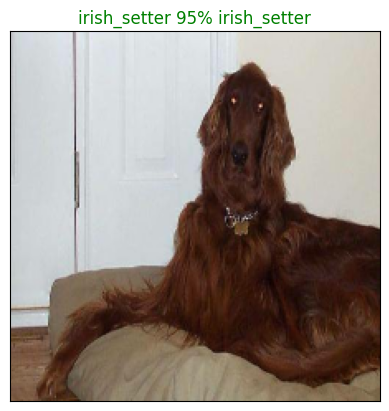

In [ ]:
plot_preds(preds=prediction,labels= val_labels, images=val_images)

As we have a fucntion to visualize our models top predictions, lets make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and ground truth array and an integer
* Find the prediction using `get_pred_labels()`
* Find the top 10:
  * Prediction probabilities
  * Prediction probability values
  * Prediction labels

In [ ]:
# plot the first 10 probability that the model thinks could be right
def pred_10image(preds, labels, n):
  pred_prob, label = preds[n], labels[n]

  pred_label = get_pred_labels(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='red')

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')


  #change color of true label
  if np.isin(label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == label)].set_color('green')
  else:
    pass


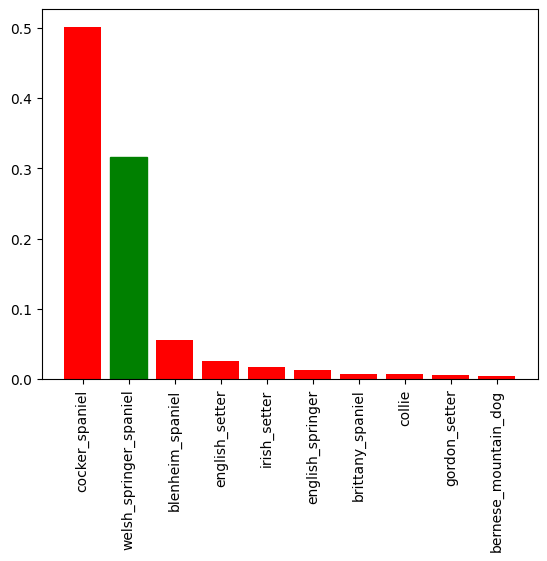

In [ ]:
pred_10image(preds=prediction,
             labels=val_labels,
             n=9)

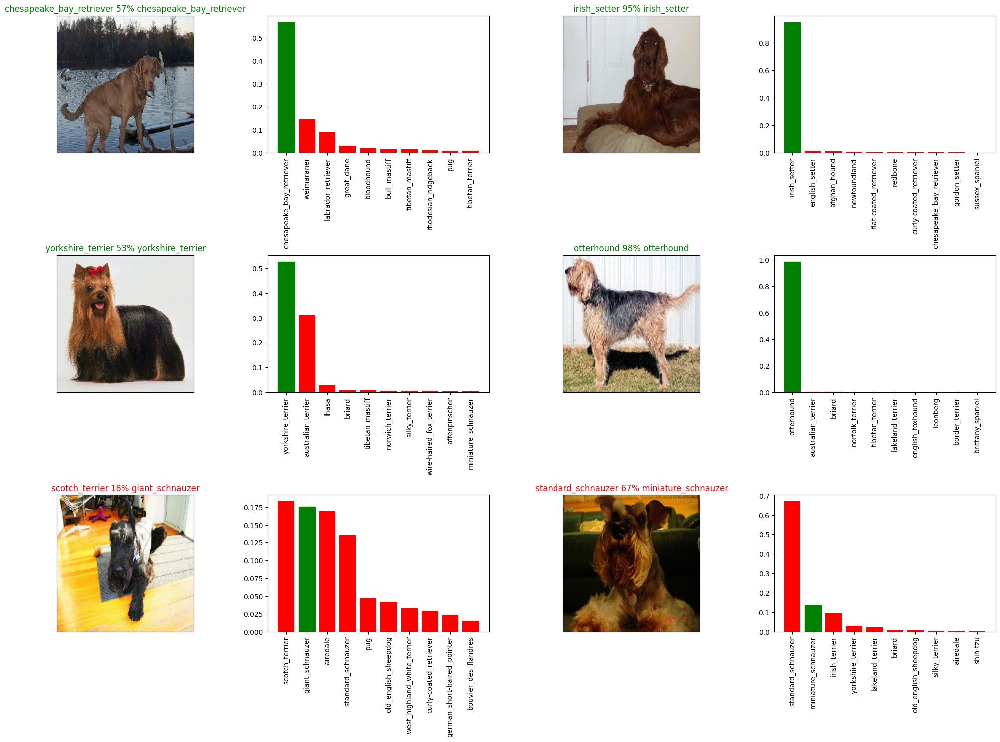

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_preds(prediction,val_labels,val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  pred_10image(prediction, val_labels, n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


### Save and load a model


In [ ]:
def  save_model(model, suffix= None):
  """
  Saves a given model in the model directory of drive
  """
  # create a directory
  modeldir = os.path.join('/content/drive/MyDrive/Dog-vision/model',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Model has been saved to the path {model_path}')
  model.save(model_path)
  return model_path


In [ ]:
# load a model
def load_model(model_path):
  """
  Loads a saved model
  """
  print(f'Loading a saved model from {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects= {"KerasLayer":hub.KerasLayer})

  return model

In [ ]:
save_model(model, suffix='trained_on_1000_images-mobilenetv2-Adam')

Model has been saved to the path /content/drive/MyDrive/Dog-vision/model/20240209-10471707475677-trained_on_1000_images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-vision/model/20240209-10471707475677-trained_on_1000_images-mobilenetv2-Adam.h5'

In [ ]:
load_1000_images_model = load_model('/content/drive/MyDrive/Dog-vision/model/20240125-08071706170062-trained_on_1000_images-mobilenetv2-Adam.h5')

Loading a saved model from /content/drive/MyDrive/Dog-vision/model/20240125-08071706170062-trained_on_1000_images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

In [ ]:
load_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.2156 - accuracy: 0.6850


[1.2155749797821045, 0.6850000023841858]

### Training model on full data set


In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batch(X,y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

BUILDING a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)


In [ ]:
full_model.fit(x= full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 48s 133ms/step - loss: 1.3503 - accuracy: 0.6683
Epoch 2/100
320/320 [==============================] - 41s 128ms/step - loss: 0.4026 - accuracy: 0.8840
Epoch 3/100
320/320 [==============================] - 43s 134ms/step - loss: 0.2370 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1523 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1070 - accuracy: 0.9770
Epoch 6/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0775 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0587 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0455 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0374 - accuracy: 0.9955
Epoch 10/100
320/320 [==============================] - 41s 130m

In [ ]:
save_model(full_model, suffix ='full_trained_model_mobilenetv2_Adam')

In [ ]:
full_model_load = load_model('/content/drive/MyDrive/Dog-vision/model/20240125-15231706196196-full_trained_model_mobilenetv2_Adam.h5')

In [ ]:
full_model_load.evaluate(val_data)

### Making prediction on test data set

Since we trained our model on images of tensor batches we will have to makes the test data inn similar type as well `create_data_batch` can be used to do this.

To make predictions on test data:
* Get the test images filenames
* Convert the filenames into test data batches using `create_data_batch` with `test_data` as True as we dont have labels in test data and we have our conditions defined above.
* Make a prediction array by passsing the test batches to `predict` method on our model

In [ ]:
# load the test image file names
test_path = 'drive/MyDrive/Dog-vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
len(test_filenames)

In [ ]:
# create test data batch
test_data = create_data_batch(X=test_filenames,test_data=True)

In [ ]:
test_data

In [ ]:
#make predictions on test data batch using the full loaded model
test_prediction = full_model_load.predict(test_data,
                                          verbose = 1)

In [ ]:
np.savetxt('drive/MyDrive/Dog-vision/preds_array.csv', test_prediction, delimiter=',')

In [ ]:
test_predictions = np.loadtxt('drive/MyDrive/Dog-vision/preds_array.csv',delimiter=',')

In [ ]:
test_predictions[:10]

array([[4.52574112e-09, 3.47761242e-09, 4.32887717e-08, ...,
        3.68171116e-09, 9.79490977e-09, 3.49672291e-08],
       [8.86533584e-08, 1.56748115e-07, 1.35642200e-08, ...,
        3.09238726e-06, 1.33614958e-04, 2.53641520e-06],
       [2.22094465e-13, 1.76805834e-10, 6.44743014e-15, ...,
        9.60774310e-15, 3.08226345e-14, 2.58927726e-13],
       ...,
       [9.95502617e-13, 7.00464079e-12, 3.33011613e-14, ...,
        9.29821676e-14, 1.49332098e-12, 4.33811814e-13],
       [4.86060185e-11, 3.03764618e-11, 8.38364045e-08, ...,
        2.86586263e-04, 5.93212502e-12, 4.09859808e-08],
       [1.50078772e-09, 3.13369427e-14, 5.12732190e-10, ...,
        2.39528601e-12, 8.59375149e-08, 2.05612721e-10]])

In [ ]:
test_predictions.shape

(10388, 120)

In [ ]:
preds_df = pd.DataFrame(columns=['id']+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['e280f6f772fa8439dcf0957a0e8b8e1d',
 'e380bd4f8375d09ae72f4f36aa610031',
 'dcab2d03a686ab3f31d1bc3e5700f6d1',
 'e431adb273c1b705e6e85147990f355e',
 'dcddc9135d0a138bb83a55bbc06adacc',
 'ddc0134def0da0472e55271da8b57c44',
 'e1e7949f64ff3283a5dafa9d39199193',
 'e751e319cfdc9912ae2e5da2a9b053e0',
 'e5fc0207e1db00fa778b00832f622b10',
 'dcd3cfe0cd6d363a3ed21639c434c8d3']

In [ ]:
preds_df['id'] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e280f6f772fa8439dcf0957a0e8b8e1d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e380bd4f8375d09ae72f4f36aa610031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcab2d03a686ab3f31d1bc3e5700f6d1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e431adb273c1b705e6e85147990f355e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dcddc9135d0a138bb83a55bbc06adacc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e280f6f772fa8439dcf0957a0e8b8e1d,4.525741e-09,3.477612e-09,4.328877e-08,3.223185e-10,5.165506e-08,3.014841e-08,5.500213e-09,1.072999e-06,4.466463e-11,...,9.680015e-10,3.638887e-09,3.830620e-11,7.228918e-08,1.782684e-07,4.205857e-09,1.011793e-07,3.681711e-09,9.794910e-09,3.496723e-08
1,e380bd4f8375d09ae72f4f36aa610031,8.865336e-08,1.567481e-07,1.356422e-08,5.063507e-09,4.845687e-07,1.743602e-08,8.528842e-06,2.217659e-07,2.739557e-08,...,4.748047e-10,5.161135e-07,5.689237e-11,5.392038e-09,3.180470e-08,4.367604e-06,8.787605e-04,3.092387e-06,1.336150e-04,2.536415e-06
2,dcab2d03a686ab3f31d1bc3e5700f6d1,2.220945e-13,1.768058e-10,6.447430e-15,1.181120e-13,1.951119e-12,1.148168e-12,5.000150e-12,5.038881e-14,3.969193e-15,...,1.952872e-13,3.902236e-14,3.257932e-12,8.279352e-13,1.454289e-11,4.261985e-12,5.395256e-15,9.607743e-15,3.082263e-14,2.589277e-13
3,e431adb273c1b705e6e85147990f355e,4.854577e-09,1.214825e-08,3.001707e-12,1.969809e-13,2.743613e-09,3.621032e-12,2.067555e-08,1.025212e-11,2.515307e-11,...,9.616979e-07,1.398365e-10,2.947056e-10,2.872385e-11,4.832597e-10,4.473502e-12,1.289392e-07,8.091598e-13,3.314791e-10,4.850905e-08
4,dcddc9135d0a138bb83a55bbc06adacc,1.194030e-08,6.635655e-10,6.708894e-10,5.172379e-10,4.745643e-11,6.295052e-12,1.893929e-11,1.781081e-10,1.445135e-11,...,9.033400e-03,2.106613e-08,5.219038e-09,1.316804e-09,8.409203e-11,9.724620e-11,4.160121e-10,1.981318e-11,5.051858e-10,4.409547e-09


In [ ]:
preds_df.to_csv('drive/MyDrive/Dog-vision/predictons.csv', index=False)